# Tree Classifier
A good description of decision tree can be found [here](http://mines.humanoriented.com/classes/2010/fall/csci568/portfolio_exports/lguo/decisionTree.html)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import linear_model, preprocessing, tree
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import FunctionTransformer
from sklearn.metrics import average_precision_score, confusion_matrix
np.random.seed(42)

/Users/tobi/anaconda3/envs/datascience/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/tobi/anaconda3/envs/datascience/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [2]:
# Prints the metrics that we're going to use to evaluate classifier performance.
def my_test_results(model, X, Y):
    cm = confusion_matrix((Y == 1), (model.predict(X) > 0.5), labels = [0,1])
    accuracy = (cm[0,0] + cm[1,1])/sum(sum(cm))
    precision = float(cm[1,1]/(cm[1,1]+cm[0,1]))
    recall = float(cm[1,1]/(cm[1,1]+cm[1,0]))
    f1 = (2.0*precision*recall)/(precision+recall)
    print("Out of sample accuracy = %4.3f" % accuracy)
    print("Out of sample precision = %4.3f" % precision)
    print("Out of sample recall = %4.3f" % recall)
    print("Out of sample F1 = %4.3f" % f1)

    ax = plt.subplot()
    sns.heatmap(cm, annot = True, ax = ax, fmt = 'g'); #annot=True to annotate cells

    # labels, title and ticks
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix')
    ax.xaxis.set_ticklabels(['Not Fraud', 'Fraud'])
    ax.yaxis.set_ticklabels(['Not Fraud', 'Fraud'])

### Import Data

* Load data
* Remove useless columns and records (only CASH_OUT and TRANSFER have fraud).
* Remap transfer to 0/1.

In [3]:
df = pd.read_csv('../simulated_transactions.csv.xz')
print(df.shape)
df.head()

(1305514, 11)


,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,2,PAYMENT,18211.33,C1099717276,88.00,0.00,M417557780,0.00,0.00,0,0
1,2,CASH_IN,93240.07,C1350751778,47.00,93287.07,C665576141,12.00,8650239.39,0,0
2,2,CASH_IN,78314.86,C332699949,93287.07,171601.93,C1359044626,178957.00,16435074.66,0,0
3,2,CASH_IN,101282.39,C808417649,171601.93,171601.93,C1599771323,171601.93,3771328.56,0,0
4,2,CASH_IN,24227.29,C858204589,171601.93,195829.22,C353842779,524999.00,872623.24,0,0


### Filtering
Filter out types other than TRANSFER, and CASH_OUT.<br>
Remove variables, 'step', 'nameOrig', 'nameDest', and 'isFlaggedFraud'.

In [4]:
X = df.drop(['step', 'nameOrig', 'nameDest', 'isFlaggedFraud'], axis = 1).query('type == "CASH_OUT" or type == "TRANSFER"')
X.loc[X.type == 'TRANSFER', 'type'] = 0
X.loc[X.type == 'CASH_OUT', 'type'] = 1
print(X.shape)

(586965, 7)


## Decision Tree Classifier
Begin preparing for the model

### Training Set
Partition the data with an 80/20 split: Training/Testing. <br>
Separate out the dependent variable from the independent varaibles.

In [5]:
train, test = train_test_split(X, test_size = 0.2, stratify = X['isFraud'])

Y_train = train['isFraud']
X_train = train.drop(['isFraud'], axis=1)

Y_test = test['isFraud']
X_test = test.drop(['isFraud'], axis=1)

### Default Decision Tree Classifier
Plug data into sklearn's decision tree classifier.

Out of sample accuracy = 0.999
Out of sample precision = 0.982
Out of sample recall = 0.971
Out of sample F1 = 0.977


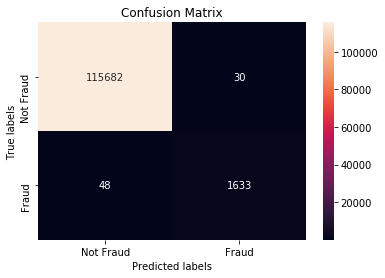

In [6]:
model = tree.DecisionTreeClassifier()

dt = model.fit(X_train, Y_train)
my_test_results(dt, X_test, Y_test)

* Accuracy - Proportion of predictions that are correct. $\frac{True Positive + True Negative}{True Positive + True Negative + False Positive + False Negative}$
* Precision - True positive over total positive actual cases. $\frac{True Positive}{True Positive + False Positive}$
* Recall - True positive over total positive predicted cases. $\frac{True Positive}{True Positive + False Negative}$
* F1 - A balance between Precision and Recall (harmonic mean of precision and recall) $\frac{2 * Precision * Recall}{Precision + Recall}$

That's not bad at all.<br>
The best part of using trees is that they are often easy to interpret. 

### Plot the tree

In [7]:
# GraphViz application must be installed in container for the plot to work
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dt, out_file = dot_data, 
                filled = True, rounded = True,
                feature_names = X_train.columns,
                class_names = list(['Not Fraud','Fraud']),
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

This tree is too deep to fully read quickly and easily.

### Plot tree with less depth

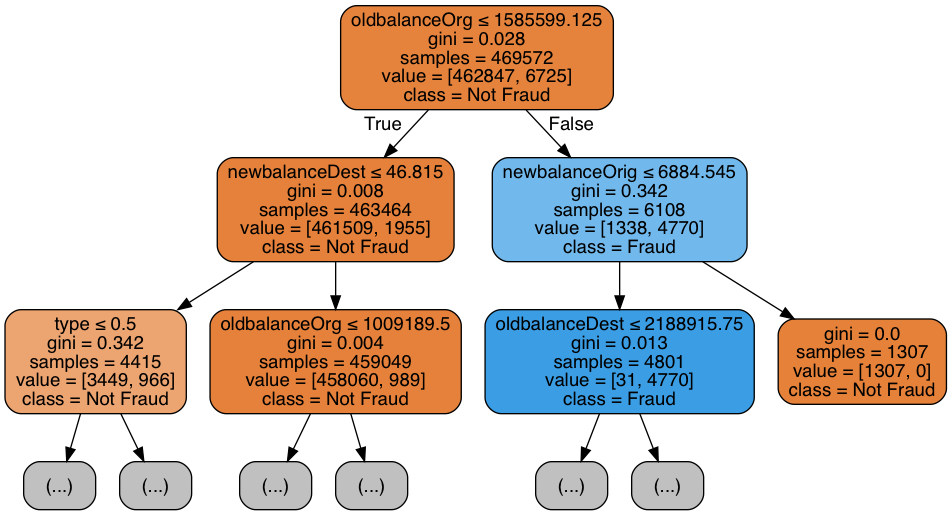

In [8]:
dot_data = StringIO()
export_graphviz(dt, out_file = dot_data, max_depth = 2,
                filled = True, rounded = True,
                feature_names = X_train.columns,
                class_names = list(['Not Fraud','Fraud']),
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

A quick scan of the down the blue path is interesting. It shows that we can catch over 1/2 of the fraud without a large false positive rate by just flagging accounts where:
* The balance before the transaction was greater than ~ 1.58mm
* The balance after the transaction was less than ~ 6.8k

i.e., Large balances were suddenly cleaned out.

### Summary
In general, a decision tree does not perform as well as many other classifiers. e.g., Neural Nets, Random Forests, etc. They are fast and easy to make, and especially easy to interpret. In some cases, deployment into production could merely be easy to code rules. It may be possible to insert them into manual processes.<br>
In this example, even if the ideal solution is a complex model behind a RESTful API. A simple rule: e.g., flag transactions greater than 1mm that bring the balance to less than 10k could be instituted by the end of the day.